This code is referenced from <br>
https://github.com/TannerGilbert/Object-Detection-and-Image-Segmentation-with-Detectron2

# Install
We have Detectron2 installed for you when you see this page

# Start trying
Ensure you have selected the right kernel (on the top right corner of jupyter lab interface), the one you have just named <br>
now we change the directory to the installed location

In [1]:
%cd detectron2

/home/test/carasml/detection/d2_MaskRCNN/detectron2


/home/test/.local/lib/python3.10/site-packages/IPython/core/magics/osm.py:417: UserWarning: This is now an optional IPython functionality, setting dhist requires you to install the `pickleshare` library.
  self.shell.db['dhist'] = compress_dhist(dhist)[-100:]


# Prepare a demo dataset
We use balloon dataset for demo <br>
This tutorial we aim at demonstrating how to start with a dataset with labeled with Labelme, so we have converted the dataset to the annotation format when installing<br>
If you have not label a dataset yet, you can use Labelme to label. Unclick Save with Image Data<br>
The dataset should be in below format

If your dataset is labeled by Labelme, you can run the below script to convert it to required format

In [2]:
# write a function that loads the dataset into detectron2's standard format
import os
import json
import numpy as np
from detectron2.structures import BoxMode
from detectron2.data import MetadataCatalog, DatasetCatalog

classes_names=["Balloon"]

def get_dataset_dicts(json_folder):
    dataset_dicts = []
    json_files = [f for f in os.listdir(json_folder) if f.endswith(".json")]

    for idx, json_file in enumerate(json_files):
        json_path = os.path.join(json_folder, json_file)
        with open(json_path, "r") as f:
            data = json.load(f)

        record = {}
        filename = os.path.join(json_folder, data["imagePath"])
        height = data["imageHeight"]
        width = data["imageWidth"]

        record["file_name"] = filename
        record["image_id"] = idx
        record["height"] = height
        record["width"] = width

        objs = []
        for shape in data["shapes"]:
            if shape["shape_type"] != "polygon":
                continue

            points = shape["points"]
            # Flatten the polygon for Detectron2
            poly = [p for xy in points for p in xy]
            px = [p[0] for p in points]
            py = [p[1] for p in points]

            obj = {
                "bbox": [min(px), min(py), max(px), max(py)],
                "bbox_mode": BoxMode.XYXY_ABS,
                "segmentation": [poly],
                "category_id": classes_names.index(shape["label"]),
            }
            objs.append(obj)

        record["annotations"] = objs
        dataset_dicts.append(record)

    return dataset_dicts

In [3]:
# register the dataset
for d in ["train","val"]:
    DatasetCatalog.register("balloon_" + d, lambda d=d: get_dataset_dicts("./dataset/balloon/" + d))
    MetadataCatalog.get("balloon_" + d).set(thing_classes=classes_names,evaluator_type="coco")
balloon_metadata = MetadataCatalog.get("balloon_train")

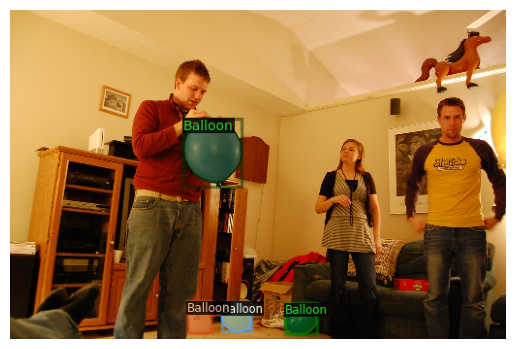

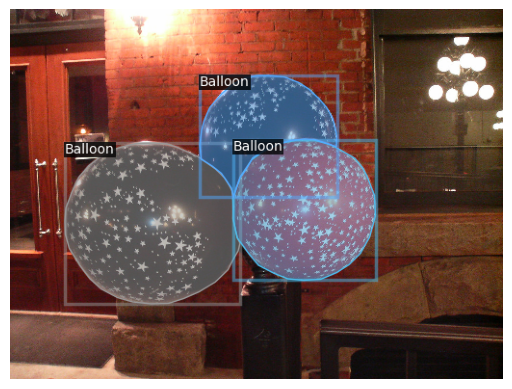

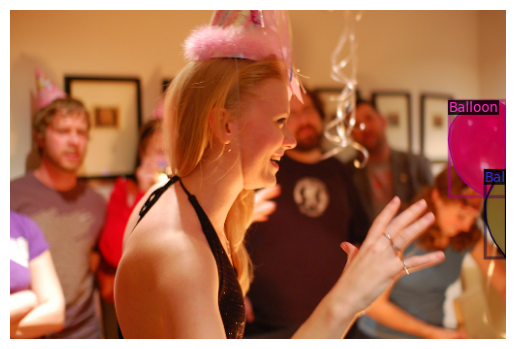

In [4]:
# lets see some samples of the dataset
import random
import matplotlib.pyplot as plt
from detectron2.utils.visualizer import Visualizer
import cv2
dataset_dicts = get_dataset_dicts("./dataset/balloon/train/")
for d in random.sample(dataset_dicts, 3):
    img = cv2.imread(d["file_name"])
    visualizer = Visualizer(img[:, :, ::-1], metadata=balloon_metadata, scale=0.5)
    out = visualizer.draw_dataset_dict(d)
    #cv2_imshow(out.get_image()[:, :, ::-1])
    im = cv2.cvtColor(out.get_image()[:, :, ::-1], cv2.COLOR_BGR2RGB)  # Convert BGR to RGB for correct colors
    plt.imshow(im)
    plt.axis("off")  # Hide axes
    plt.show()

# Train our model

You can go to <br>
detectron2/detectron2/model_zoo/model_zoo.py <br>
to choose a model <br>
name "my_yaml" as the location of the yaml <br>
Check <br>
https://github.com/facebookresearch/detectron2/blob/main/MODEL_ZOO.md <br>
for details of models

In [5]:
# e.g.
my_yaml = "COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml"

In [6]:
# clear metrics.json for new training
import os
metrics_file = "output/metrics.json"
if os.path.exists(metrics_file):
    os.remove(metrics_file)

In [7]:
#from detectron2.engine import DefaultTrainer
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2 import model_zoo
cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file(my_yaml))
# check current config before adjustment
print(cfg)

CUDNN_BENCHMARK: False
DATALOADER:
  ASPECT_RATIO_GROUPING: True
  FILTER_EMPTY_ANNOTATIONS: True
  NUM_WORKERS: 4
  REPEAT_SQRT: True
  REPEAT_THRESHOLD: 0.0
  SAMPLER_TRAIN: TrainingSampler
DATASETS:
  PRECOMPUTED_PROPOSAL_TOPK_TEST: 1000
  PRECOMPUTED_PROPOSAL_TOPK_TRAIN: 2000
  PROPOSAL_FILES_TEST: ()
  PROPOSAL_FILES_TRAIN: ()
  TEST: ('coco_2017_val',)
  TRAIN: ('coco_2017_train',)
FLOAT32_PRECISION: 
GLOBAL:
  HACK: 1.0
INPUT:
  CROP:
    ENABLED: False
    SIZE: [0.9, 0.9]
    TYPE: relative_range
  FORMAT: BGR
  MASK_FORMAT: polygon
  MAX_SIZE_TEST: 1333
  MAX_SIZE_TRAIN: 1333
  MIN_SIZE_TEST: 800
  MIN_SIZE_TRAIN: (640, 672, 704, 736, 768, 800)
  MIN_SIZE_TRAIN_SAMPLING: choice
  RANDOM_FLIP: horizontal
MODEL:
  ANCHOR_GENERATOR:
    ANGLES: [[-90, 0, 90]]
    ASPECT_RATIOS: [[0.5, 1.0, 2.0]]
    NAME: DefaultAnchorGenerator
    OFFSET: 0.0
    SIZES: [[32], [64], [128], [256], [512]]
  BACKBONE:
    FREEZE_AT: 2
    NAME: build_resnet_fpn_backbone
  DEVICE: cuda
  FPN:
    F

# Augmentations
We can use the package built-in augmentation policy or add Albumentations function to the process <br>
Choose either one but we suggest stick to built-in augmentation if it satistys your needs <br>
Try gradually intensify augmentation <br>
Here we first introduce built-in augmentation <br>
You can know more about it at https://detectron2.readthedocs.io/en/latest/tutorials/augmentation.html#basic-usage <br>

In [8]:
# check current augmentation policy before adjustment
from detectron2.data import DatasetMapper
mapper = DatasetMapper(cfg, is_train=True)
print(mapper.augmentations)

AugmentationList[ResizeShortestEdge(short_edge_length=(640, 672, 704, 736, 768, 800), max_size=1333, sample_style='choice'), RandomFlip()]


In [9]:
# Replace the list with our self defined one
from detectron2.data import transforms as T

transform_list = [
        T.ResizeShortestEdge(short_edge_length=(640, 672, 704, 736, 768, 800), max_size=1333, sample_style='choice'), # copy
        T.RandomFlip(),  # copy
        T.RandomBrightness(0.9, 1.1), # you define, divert from 1
        T.RandomContrast(0.9, 1.1), # you define, divert from 1
        T.RandomSaturation(0.9, 1.1), # you define, divert from 1
        T.RandomRotation(angle=[-10, 10]), # you define, divert from 0 upto 90, not recommend too large
        T.RandomLighting(0.1), # you define, more the stronger
    ]

# Append it to the end (or use insert to place it earlier)
mapper.augmentations = T.AugmentationList(transform_list)

We then introduce albumentations augmentation <br>
you can know more about it at https://github.com/albumentations-team/albumentations

In [10]:
# check current augmentation policy before adjustment
from detectron2.data import DatasetMapper
mapper = DatasetMapper(cfg, is_train=True)
print(mapper.albumentations)
# its none by default

[]


In [11]:
import albumentations as A
# add yours
transform_list = [
        A.Affine(rotate=(-10, 10), shear=(-2.5, 2.5), p=1.0), 
        A.RandomBrightnessContrast(brightness_limit=0.1, contrast_limit=0.1, p=1.0),
        A.HueSaturationValue(hue_shift_limit=10, sat_shift_limit=10, val_shift_limit=10, p=1.0),
        ]
mapper.albumentations = transform_list

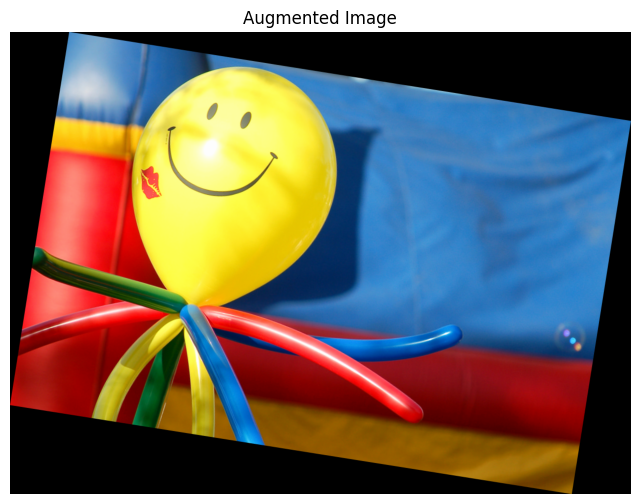

In [10]:
# See what augmentation do, you may rerun the script, that get different result
sample = dataset_dicts[0]  # Take one sample
# Apply the mapper (this runs the augmentation pipeline)
augmented = mapper(sample)
# The image is in CHW format and BGR
img = augmented["image"].permute(1, 2, 0).numpy()  # Convert to HWC
img = img[:, :, ::-1]  # BGR to RGB
# Plot with matplotlib
plt.figure(figsize=(10, 6))
plt.imshow(img)
plt.title("Augmented Image")
plt.axis("off")
plt.show()

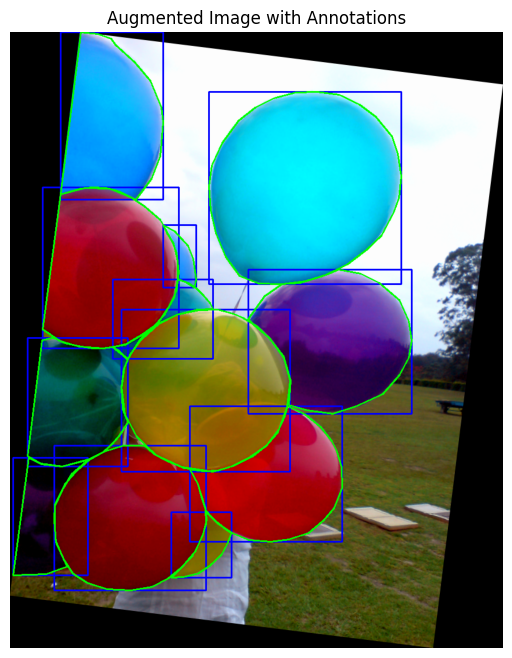

In [11]:
import numpy as np
import matplotlib.pyplot as plt
import cv2
from detectron2.structures import Instances

def visualize_augmented_image(augmented):
    """
    Visualize augmented image with instance segmentation masks in Jupyter Lab.
    
    Args:
        augmented (dict): Dictionary containing augmented data with keys:
            - "image": Tensor image (C, H, W)
            - "instances" (optional): Instances object with masks
    """
    # Convert tensor image to numpy and change channel order
    img = augmented["image"].numpy().transpose(1, 2, 0)
    img = np.ascontiguousarray(img)
    
    # Create figure
    plt.figure(figsize=(12, 8))
    
    # Draw masks if available
    if "instances" in augmented:
        instances = augmented["instances"]
        
        # Draw bounding boxes
        if hasattr(instances, "gt_boxes"):
            boxes = instances.gt_boxes.tensor.cpu().numpy()
            for box in boxes:
                x1, y1, x2, y2 = box.astype(int)
                cv2.rectangle(img, (x1, y1), (x2, y2), (255, 0, 0), 2)
        
        # Draw segmentation masks
        if hasattr(instances, "gt_masks"):
            # For polygon masks
            if hasattr(instances.gt_masks, "polygons"):
                polygons = instances.gt_masks.polygons
                for obj_polys in polygons:
                    for poly in obj_polys:
                        pts = np.array(poly, dtype=np.int32).reshape(-1, 2)
                        cv2.polylines(img, [pts], isClosed=True, color=(0, 255, 0), thickness=2)
            
            # For bitmask masks
            elif hasattr(instances.gt_masks, "tensor"):
                masks = instances.gt_masks.tensor.cpu().numpy()
                for mask in masks:
                    # Create transparent overlay
                    overlay = img.copy()
                    mask = mask.astype(bool)
                    overlay[mask] = (0, 255, 0)  # Green mask
                    img = cv2.addWeighted(overlay, 0.3, img, 0.7, 0)
    
    # Convert BGR to RGB for matplotlib
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    
    # Display image
    plt.imshow(img_rgb)
    plt.axis('off')
    plt.title("Augmented Image with Annotations")
    plt.show()

# Example usage:
sample = dataset_dicts[17]  # Take one sample
# Apply the mapper (this runs the augmentation pipeline)
augmented = mapper(sample)
visualize_augmented_image(augmented)

In [12]:
from tools.train_net import Trainer
from detectron2.data import build_detection_train_loader
class CustomTrainer(Trainer):
    @classmethod
    def build_train_loader(cls, cfg):
        return build_detection_train_loader(cfg, mapper=mapper)

# start training !!
you may revise the configs to meet your custom needs

In [13]:
cfg.DATASETS.TRAIN = ("balloon_train",)
cfg.DATASETS.TEST = ("balloon_val",) 
cfg.DATALOADER.NUM_WORKERS = 8
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url(my_yaml)
cfg.SOLVER.LR_SCHEDULER_NAME = 'WarmupCosineLR' # This is our preferred scheduler
cfg.SOLVER.IMS_PER_BATCH = 8  # batch size
cfg.SOLVER.BASE_LR = cfg.SOLVER.BASE_LR/16  # pick a good LR, if you have no idea, start with the default divided by 8
cfg.SOLVER.MAX_ITER = 500    # 1000 iterations seems good enough for this toy dataset; you will need to train longer for a practical dataset
cfg.SOLVER.STEPS = []         # decay learning rate (none here)
cfg.SOLVER.WARMUP_ITERS = 50 # warmup iteration, a small fraction of max iteration
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 128   # The "RoIHead batch size". 128 is faster, and good enough for this toy dataset (default: 512)
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 1  # 2 classes (we have tortoise and lizard)
# NOTE: this config means the number of classes, but a few popular unofficial tutorials incorrect uses num_classes+1 here.

# Validation settings
cfg.TEST.EVAL_PERIOD = 100  # Evaluate every 100 iterations
cfg.SOLVER.CHECKPOINT_PERIOD = 100  # Save checkpoint every 100 iterations

os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
trainer = CustomTrainer(cfg)
trainer.resume_or_load(resume=False)
trainer.train()

[07/04 16:47:06 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

Skip loading parameter 'roi_heads.box_predictor.cls_score.weight' to the model due to incompatible shapes: (81, 1024) in the checkpoint but (2, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.cls_score.bias' to the model due to incompatible shapes: (81,) in the checkpoint but (2,) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.weight' to the model due to incompatible shapes: (320, 1024) in the checkpoint but (4, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.bias' to the model due to incompatible shapes: (320,) in the checkpoint but (4,) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.mask_head.predictor.weight' to the model due to incompatible shapes: (80, 256, 1, 1) in the checkpoint but (1, 256, 1, 1) in

[07/04 16:47:06 d2.engine.train_loop]: Starting training from iteration 0


/opt/miniconda3/envs/maskrcnn/lib/python3.10/site-packages/torch/functional.py:554: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at /pytorch/aten/src/ATen/native/TensorShape.cpp:4314.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


[07/04 16:47:13 d2.utils.events]:  eta: 0:02:06  iter: 19  total_loss: 1.75  loss_cls: 0.5177  loss_box_reg: 0.6373  loss_mask: 0.5678  loss_rpn_cls: 0.03612  loss_rpn_loc: 0.01117    time: 0.2670  last_time: 0.2537  data_time: 0.0315  last_data_time: 0.0045   lr: 0.00046415  max_mem: 10635M
[07/04 16:47:18 d2.utils.events]:  eta: 0:02:01  iter: 39  total_loss: 0.8853  loss_cls: 0.1677  loss_box_reg: 0.5544  loss_mask: 0.1426  loss_rpn_cls: 0.01849  loss_rpn_loc: 0.01195    time: 0.2699  last_time: 0.2690  data_time: 0.0145  last_data_time: 0.0191   lr: 0.00095142  max_mem: 10635M
[07/04 16:47:24 d2.utils.events]:  eta: 0:01:56  iter: 59  total_loss: 0.4294  loss_cls: 0.08418  loss_box_reg: 0.2136  loss_mask: 0.08622  loss_rpn_cls: 0.01265  loss_rpn_loc: 0.01051    time: 0.2700  last_time: 0.2596  data_time: 0.0115  last_data_time: 0.0273   lr: 0.0012075  max_mem: 10635M
[07/04 16:47:30 d2.utils.events]:  eta: 0:01:55  iter: 79  total_loss: 0.3182  loss_cls: 0.06823  loss_box_reg: 0.14

In [14]:
import torch
#after training/testing, clear cache
torch.cuda.empty_cache()
torch.cuda.synchronize()

# plot learning curve

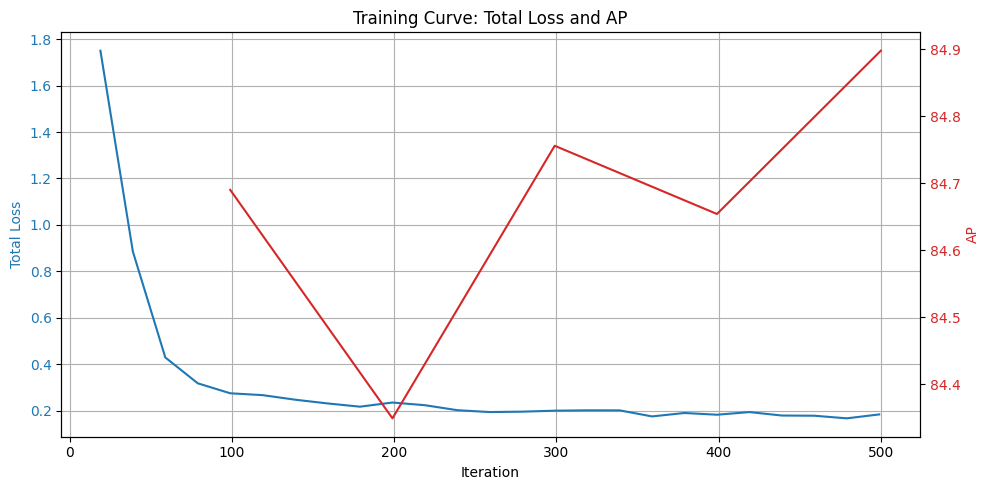

In [15]:
import matplotlib.pyplot as plt
import json

def plot_training_curve(json_path):
    # Load the metrics
    with open(json_path, 'r') as f:
        lines = f.readlines()
        metrics = [json.loads(line) for line in lines if 'total_loss' in line]
        metrics2 = [json.loads(line) for line in lines if 'segm/AP' in line]

    iterations = [x["iteration"] for x in metrics]
    losses = [x["total_loss"] for x in metrics]
    iterations2 = [x["iteration"] for x in metrics2]
    ap = [x["segm/AP"] for x in metrics2]

    # Create figure and first axis
    fig, ax1 = plt.subplots(figsize=(10, 5))

    # Plot loss on the left y-axis
    color = 'tab:blue'
    ax1.set_xlabel("Iteration")
    ax1.set_ylabel("Total Loss", color=color)
    ax1.plot(iterations, losses, color=color, label="Total Loss")
    ax1.tick_params(axis='y', labelcolor=color)
    ax1.grid(True)

    # Create second y-axis for AP50
    ax2 = ax1.twinx()
    color = 'tab:red'
    ax2.set_ylabel("AP", color=color)
    ax2.plot(iterations2, ap, color=color, label="AP")
    ax2.tick_params(axis='y', labelcolor=color)

    # Title and layout
    plt.title("Training Curve: Total Loss and AP")
    fig.tight_layout()
    plt.show()

    
plot_training_curve("output/metrics.json")

# Read the training log
Every few iteration, the log prints current training status incluing Loss and learning rate(LR). <br>
and then current performance in COCO metrics. <br>

In ideal scenario, training loss decreases and accuracy increases gradually throughout the training. <br> 
When it comes to the end of training, training loss would still decreases slightly, while accuracy stops improving, and it should be already satisfactory. <br>
 <br>
If training loss decreases and accuracy increases slowly, you may increase learning rate (eg double it) <br>
If both training loss and accuracy flutuate violently, you may decrease learning rate (eg half it) <br>
If accuracy is still improving at the end of training, you may increase number of epoch <br>
If training loss decreases while accuracy stagnates or worsens before getting satisfactory accuracy, you should add more samples or implement stronger augmentation, and ensure the two datasets are alike <br>
If both training loss and accuracy stagnates, and the accuracy is not satisfactory, you should consider choosing a more advanced or larger model <br>

# Inference
Here we inference on images <br>

In [16]:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.8  
predictor = DefaultPredictor(cfg)

[07/04 16:49:44 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from ./output/model_final.pth ...


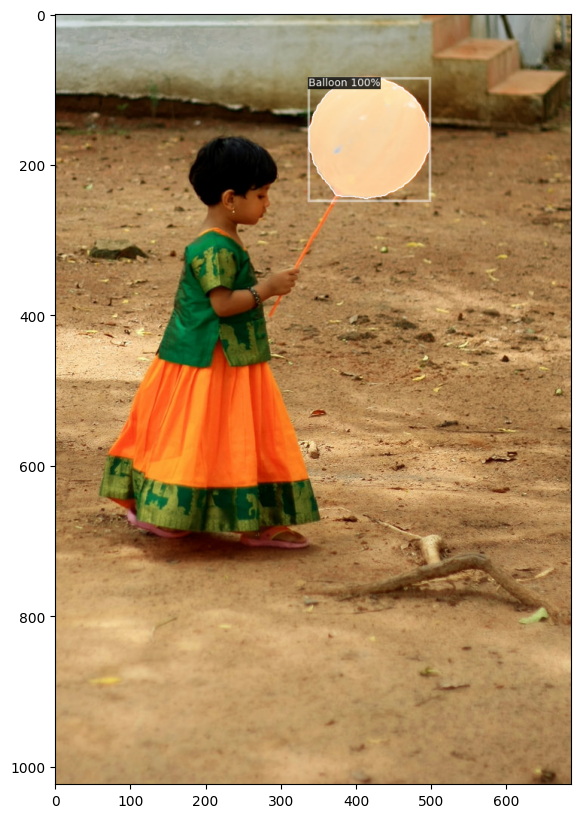

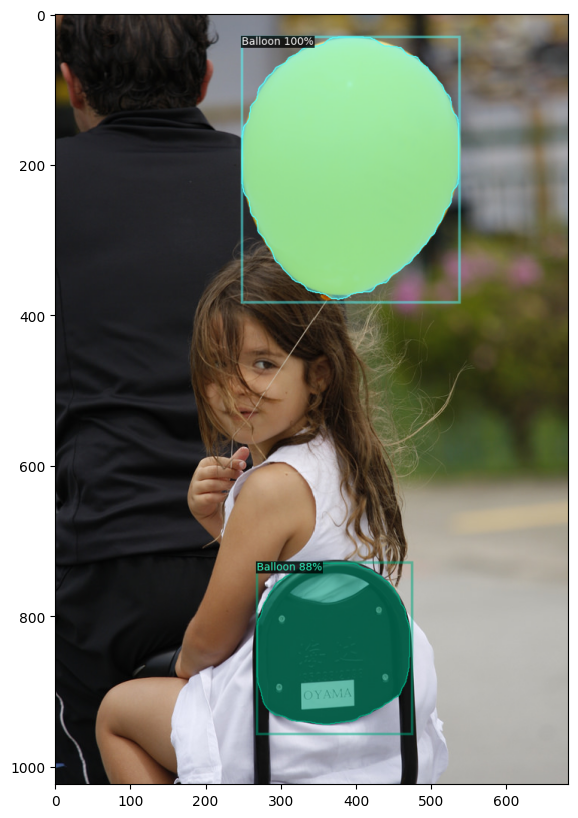

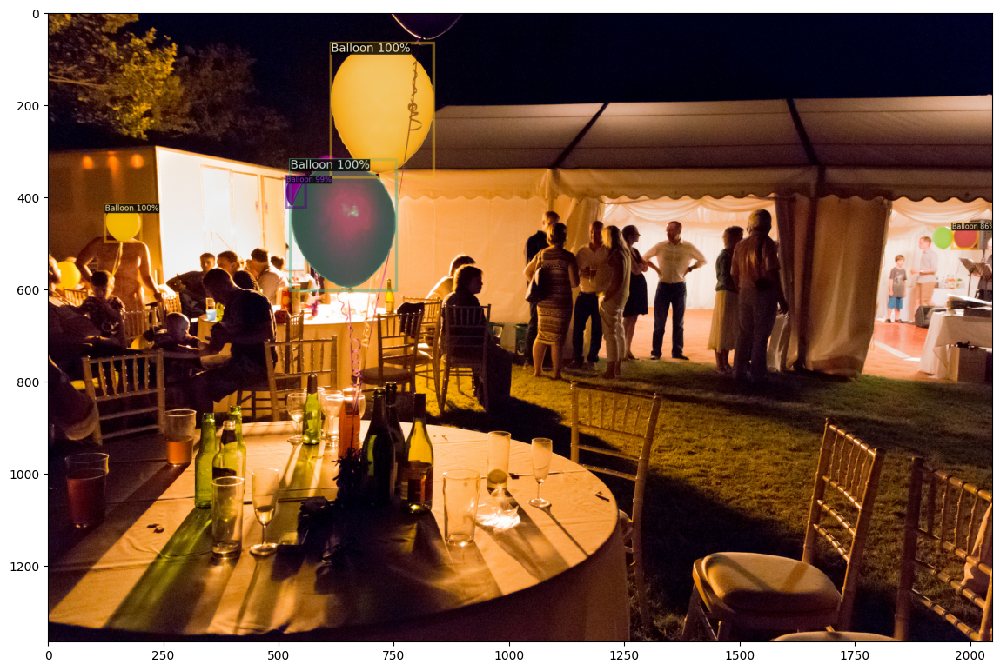

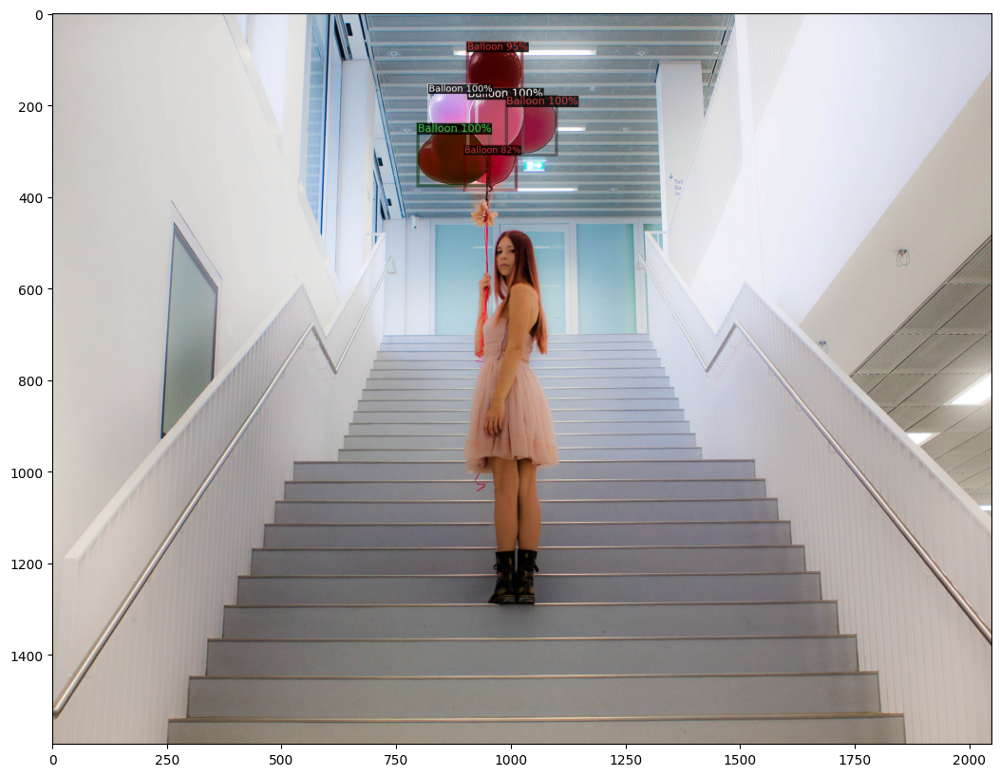

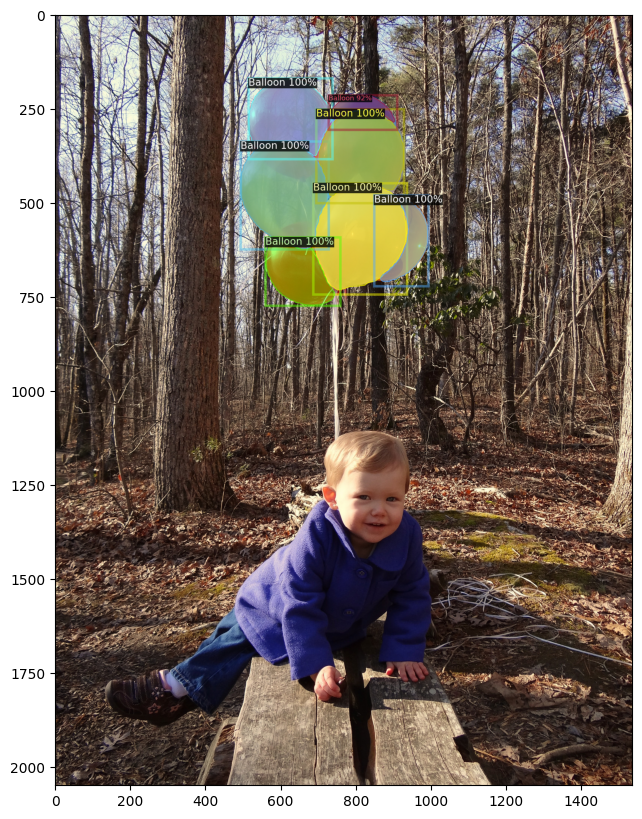

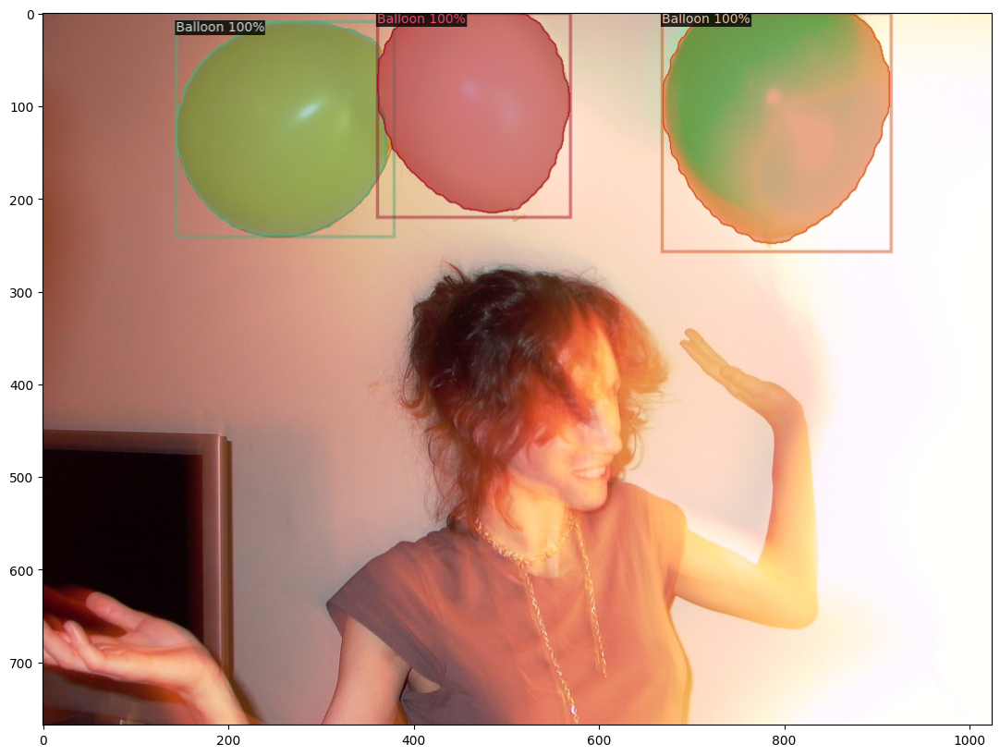

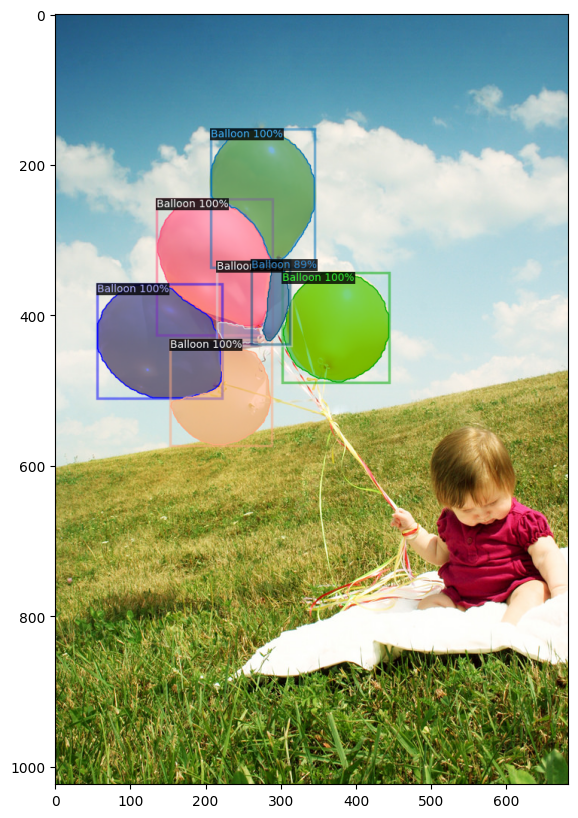

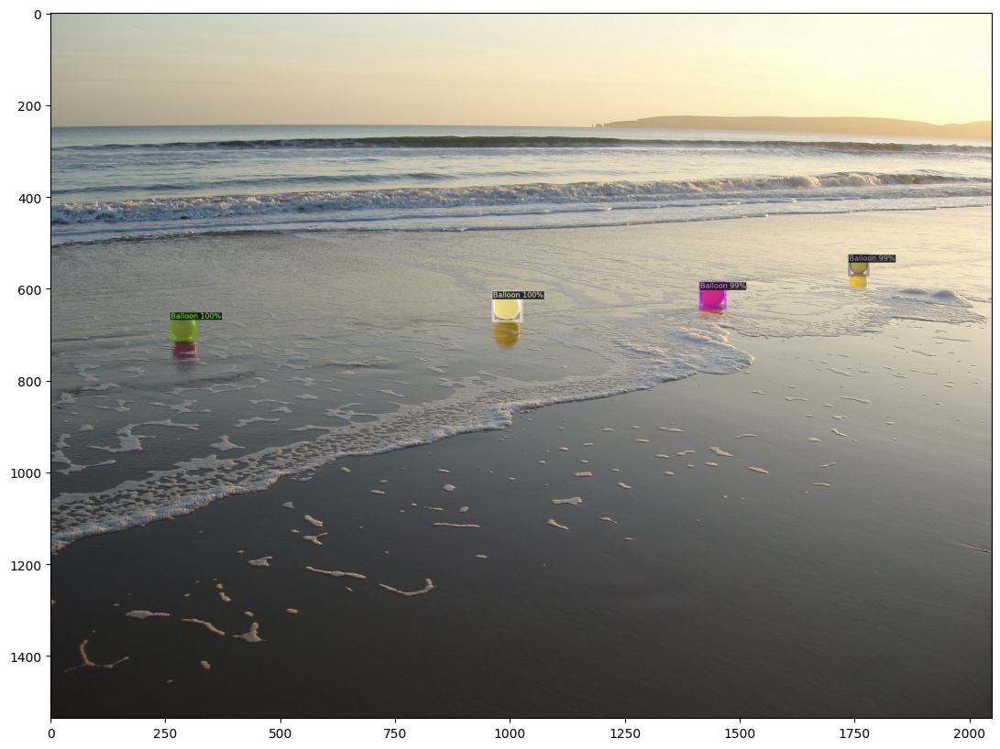

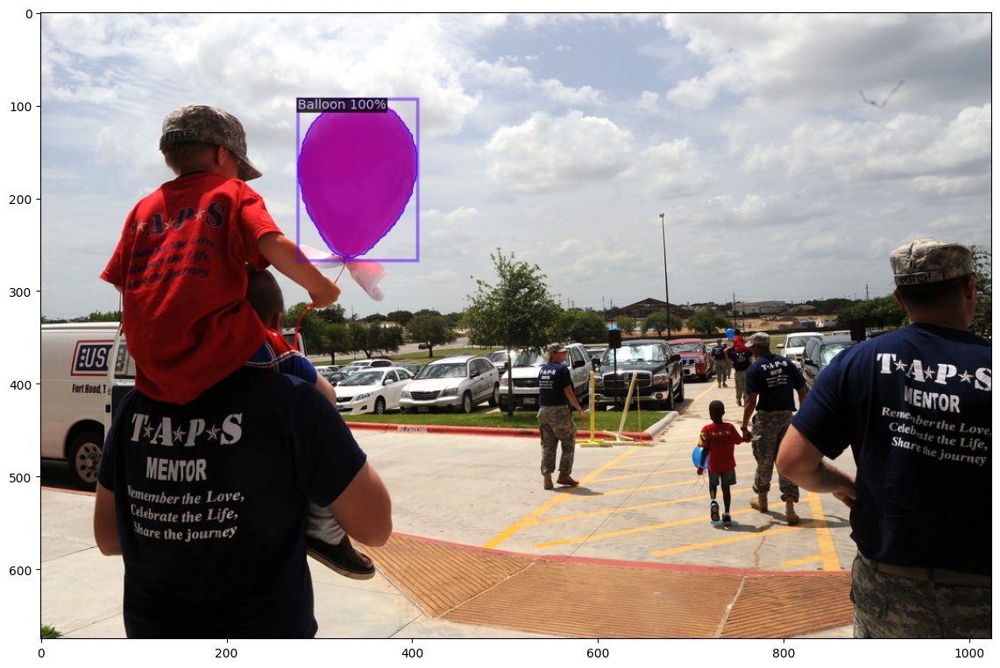

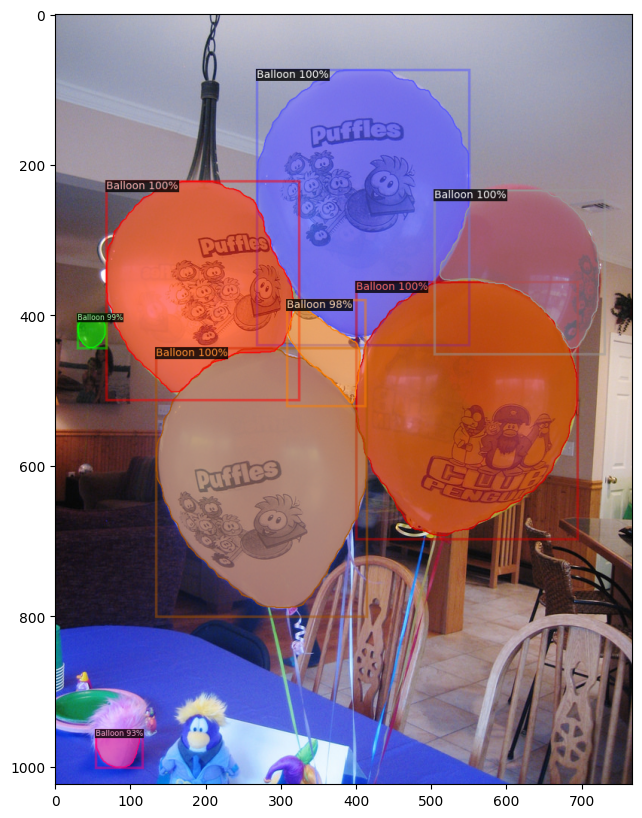

In [17]:
from detectron2.utils.visualizer import ColorMode
import random
dataset_dicts = get_dataset_dicts("./dataset/balloon/val/")
balloon_metadata_val = MetadataCatalog.get("balloon_val")
for d in random.sample(dataset_dicts, 10):    
    im = cv2.imread(d["file_name"])
    outputs = predictor(im)
    v = Visualizer(im[:, :, ::-1], metadata=balloon_metadata_val, scale=1)
    v = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    plt.figure(figsize = (14, 10))
    plt.imshow(cv2.cvtColor(v.get_image()[:, :, ::-1], cv2.COLOR_BGR2RGB))
    plt.show()

# Export the model to onnx

In [18]:
import torch
from detectron2.config import get_cfg
from detectron2.modeling import build_model
from detectron2.checkpoint import DetectionCheckpointer
from detectron2.export import TracingAdapter
from detectron2.data import build_detection_test_loader
from detectron2 import model_zoo
import os
import onnx 
import cv2

my_yaml = "COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml"
# Step 1: Load the configuration and model
cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file(my_yaml))
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
cfg.MODEL.DEVICE = "cuda"
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 1
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.8  # Set threshold for this demo

# Step 2: Create Pytorch Model
model = build_model(cfg)
DetectionCheckpointer(model).load(cfg.MODEL.WEIGHTS)
model.eval()

# Step 3: Trace the model with appropriate inputs
#im can be any image of your training/validation dataset 
im = cv2.imread("./dataset/balloon/val/14898532020_ba6199dd22_k.jpg")
im_torch = torch.as_tensor(im.astype("float32").transpose(2, 0, 1))
inputs = [{"image": im_torch}]

traceable_model = TracingAdapter(model, inputs, None)

# Step 4: Export to ONNX with appropriate dynamic axes
torch.onnx.export(traceable_model, (im_torch,), 
                  "./output/model.onnx", 
                  opset_version=16,
                  input_names = ['image'],
                  output_names = ['instances'],
                  dynamic_axes={'image' : {1 : 'height', 2: 'width'},
                                'instances' : {0 : 'batch_size'}}
                                )

[07/04 16:49:49 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from ./output/model_final.pth ...


/home/test/carasml/detection/d2_MaskRCNN/detectron2/detectron2/structures/image_list.py:86: TracerWarning: Converting a tensor to a Python boolean might cause the trace to be incorrect. We can't record the data flow of Python values, so this value will be treated as a constant in the future. This means that the trace might not generalize to other inputs!
  assert t.shape[:-2] == tensors[0].shape[:-2], t.shape
/home/test/carasml/detection/d2_MaskRCNN/detectron2/detectron2/structures/boxes.py:151: TracerWarning: Converting a tensor to a Python boolean might cause the trace to be incorrect. We can't record the data flow of Python values, so this value will be treated as a constant in the future. This means that the trace might not generalize to other inputs!
  if tensor.numel() == 0:
/home/test/carasml/detection/d2_MaskRCNN/detectron2/detectron2/structures/boxes.py:155: TracerWarning: Converting a tensor to a Python boolean might cause the trace to be incorrect. We can't record the data f

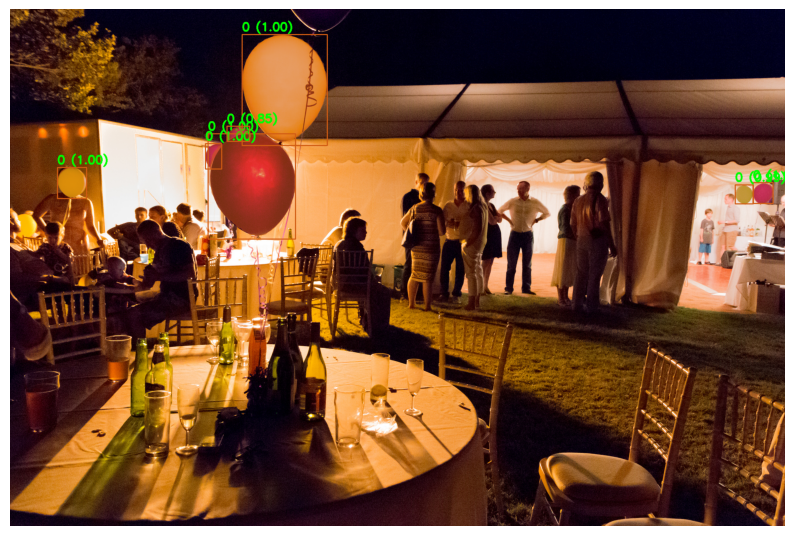

In [19]:
import cv2
import numpy as np
import onnxruntime as ort
import matplotlib.pyplot as plt

# Create an ONNX Runtime session
session = ort.InferenceSession("./output/model.onnx")

# Load image
im = cv2.imread("./dataset/balloon/val/14898532020_ba6199dd22_k.jpg")
im = cv2.cvtColor(im, cv2.COLOR_BGR2RGB)

# Run inference
outputs = session.run(None, {"image": im.astype("float32").transpose(2, 0, 1)})

# Get the outputs
#boxes, scores, classes, masks = outputs
boxes, classes, masks, scores,_  = outputs

# Create a list of random colors for each class
num_classes = len(np.unique(classes))  # Assuming classes are 0-indexed
colors = np.random.randint(0, 255, size=(num_classes, 3))


# Process each mask
for i in range(len(classes)):
    score = scores[i]
    class_id = int(classes[i])
    color = colors[class_id]
    mask = masks[i]

    # Create colored mask
    colored_mask = np.zeros_like(im)
    colored_mask[mask] = color

    # Add colored mask to overlay with transparency
    alpha = 0.5  # Transparency factor
    im = np.where(colored_mask != 0, 
                      cv2.addWeighted(im, 1 - alpha, colored_mask, alpha, 0),
                      im)

    # Draw bounding box and label
    box = boxes[i]
    x_min, y_min, x_max, y_max = box
    cv2.rectangle(im, (int(x_min), int(y_min)), (int(x_max), int(y_max)), 
                 color.tolist(), 2)
    cv2.putText(im, f'{class_id} ({score:.2f})', 
               (int(x_min), int(y_min - 10)),
               cv2.FONT_HERSHEY_SIMPLEX, 1, (0, 255, 0), 3)

# Display the result
plt.figure(figsize=(10, 10))
plt.imshow(im)
plt.axis('off')
plt.show()

# Assess performance for each class
To better understand how our model perform, we can plot precision recall curve and confusion matrix

In [20]:
#In case you want to evaluate specific checkpoints, you can run this script. Here we proceed base on the predictions of last checkpoint.
'''
# Step 1: Load the configuration and model
cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file(my_yaml))
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_0000199.pth")
cfg.MODEL.DEVICE = "cuda"
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 1
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.01  # To plot the below chart we set 0.01, otherwise you can set desired threshold

# Step 2: Create Pytorch Model
model = build_model(cfg)
DetectionCheckpointer(model).load(cfg.MODEL.WEIGHTS)
model.eval()

# Step 3: Run Evaluation Function
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.data import build_detection_test_loader
evaluator = COCOEvaluator("balloon_val", ("segm",), False, output_dir="./output/eval")
val_loader = build_detection_test_loader(cfg, "balloon_val")
print(inference_on_dataset(model, val_loader, evaluator)) 

import torch
#after training/testing, clear cache
torch.cuda.empty_cache()
torch.cuda.synchronize()
'''

'\n# Step 1: Load the configuration and model\ncfg = get_cfg()\ncfg.merge_from_file(model_zoo.get_config_file(my_yaml))\ncfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_0000199.pth")\ncfg.MODEL.DEVICE = "cuda"\ncfg.MODEL.ROI_HEADS.NUM_CLASSES = 1\ncfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.01  # To plot the below chart we set 0.01, otherwise you can set desired threshold\n\n# Step 2: Create Pytorch Model\nmodel = build_model(cfg)\nDetectionCheckpointer(model).load(cfg.MODEL.WEIGHTS)\nmodel.eval()\n\n# Step 3: Run Evaluation Function\nfrom detectron2.evaluation import COCOEvaluator, inference_on_dataset\nfrom detectron2.data import build_detection_test_loader\nevaluator = COCOEvaluator("balloon_val", ("segm",), False, output_dir="./output/eval")\nval_loader = build_detection_test_loader(cfg, "balloon_val")\nprint(inference_on_dataset(model, val_loader, evaluator)) \n\nimport torch\n#after training/testing, clear cache\ntorch.cuda.empty_cache()\ntorch.cuda.synchronize()\n'

loading annotations into memory...
Done (t=0.00s)
creating index...
index created!


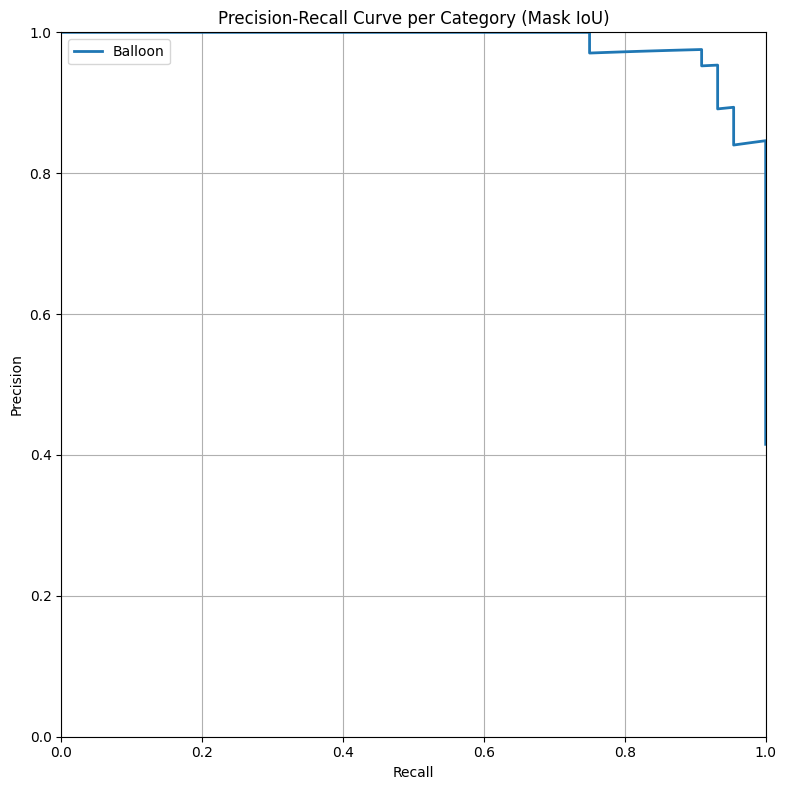

In [3]:
import json
import numpy as np
import matplotlib.pyplot as plt
from pycocotools.coco import COCO
from pycocotools import mask as maskUtils  # For RLE operations
from collections import defaultdict
from sklearn.metrics import precision_recall_curve

#When training and validation executed previously, it saves the ground turth annotation json here
truth_json = 'output/inference/balloon_val_coco_format.json'
#When training and validation executed previously, it saves the prediction annotation json here
pred_json = 'output/inference/coco_instances_results.json'
coco_gt = COCO(truth_json)
with open(pred_json, 'r') as f:
    predictions = json.load(f)

# Get category ID to name mapping
categories = coco_gt.loadCats(coco_gt.getCatIds())
cat_id_to_name = {cat['id']: cat['name'] for cat in categories}
cat_ids = list(cat_id_to_name.keys())

# Group predictions by category
preds_by_cat = defaultdict(list)
for pred in predictions:
    preds_by_cat[pred['category_id']].append(pred)

# Group GT annotations by category
gt_by_cat = defaultdict(list)
for ann in coco_gt.dataset['annotations']:
    gt_by_cat[ann['category_id']].append(ann)

def compute_mask_iou(rle1, rle2):
    """
    Compute IoU between two RLE masks using pycocotools.
    Args:
        rle1: RLE mask (dict with 'counts' and 'size')
        rle2: RLE mask (dict with 'counts' and 'size')
    Returns:
        iou (float): Intersection over Union
    """
    # Decode RLEs to binary masks
    mask1 = maskUtils.decode(rle1)
    mask2 = maskUtils.decode(rle2)
    
    # Intersection and Union
    intersection = np.logical_and(mask1, mask2)
    union = np.logical_or(mask1, mask2)
    
    iou = np.sum(intersection) / (np.sum(union) + 1e-6)  # Avoid division by zero
    return iou

iou_threshold = 0.8
class_curves = {}

for cat_id in cat_ids:
    y_true = []
    y_scores = []

    preds = sorted(preds_by_cat[cat_id], key=lambda x: -x['score'])
    gt_annots = gt_by_cat[cat_id]
    used = set()

    for pred in preds:
        pred_rle = {
            'size': pred['segmentation']['size'],
            'counts': pred['segmentation']['counts']
        }
        image_id = pred['image_id']
        best_iou = iou_threshold
        best_gt_id = None

        for gt in gt_annots:
            if gt['image_id'] != image_id or gt['id'] in used:
                continue
            
            # Polygon format (convert to RLE)
            polygon = gt['segmentation']
            
            # Get image dimensions from COCO
            img_info = coco_gt.loadImgs(gt['image_id'])[0]
            height, width = img_info['height'], img_info['width']
            
            # Convert polygon to RLE
            gt_rle = maskUtils.frPyObjects(polygon, height, width)
            gt_rle = maskUtils.merge(gt_rle) #gt_rle[0]  # frPyObjects returns a list; take the first element
            
            iou = compute_mask_iou(pred_rle, gt_rle)
            if iou > best_iou:
                best_iou = iou
                best_gt_id = gt['id']
                
        used.add(best_gt_id)
        y_true.append(1 if best_gt_id is not None else 0)
        y_scores.append(pred['score'])

    if len(set(y_true)) < 2:
        if sum(y_true) == 0:
            print(f"Class {cat_id_to_name[cat_id]} has ALL FALSE POSITIVES (no TP).")
        else:
            print(f"Class {cat_id_to_name[cat_id]} has ALL TRUE POSITIVES (no FP).")
        continue

    precision, recall, _ = precision_recall_curve(y_true, y_scores)
    class_curves[cat_id] = {
        'precision': precision,
        'recall': recall
    }

# Plotting Precision-Recall curves (same as before)
plt.figure(figsize=(10, 8))
for cat_id, data in class_curves.items():
    plt.plot(data['recall'], data['precision'], label=cat_id_to_name[cat_id], linewidth=2)

plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curve per Category (Mask IoU)')
plt.grid(True)
plt.legend()
plt.xlim([0, 1])
plt.ylim([0, 1])
plt.gca().set_aspect('equal', adjustable='box')
plt.tight_layout()
plt.show()

loading annotations into memory...
Done (t=0.00s)
creating index...
index created!


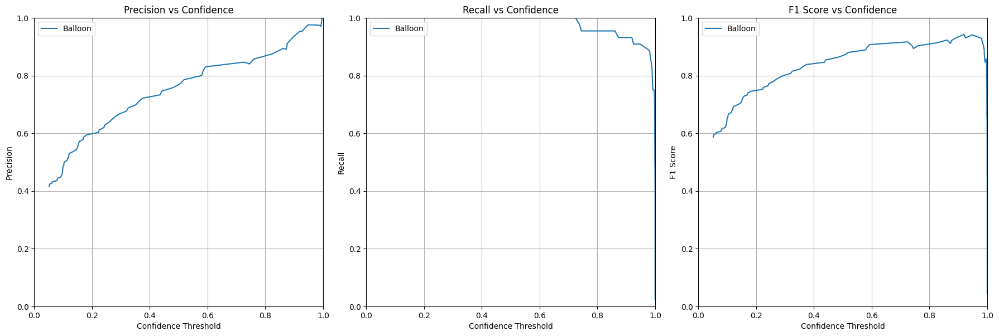

In [4]:
import json
import numpy as np
import matplotlib.pyplot as plt
from pycocotools.coco import COCO
from collections import defaultdict
from sklearn.metrics import precision_recall_curve

#When training and validation executed previously, it saves the ground turth annotation json here
truth_json = 'output/inference/balloon_val_coco_format.json'
#When training and validation executed previously, it saves the prediction annotation json here
pred_json = 'output/inference/coco_instances_results.json'
coco_gt = COCO(truth_json)
with open(pred_json, 'r') as f:
    predictions = json.load(f)

# Get category ID to name mapping
categories = coco_gt.loadCats(coco_gt.getCatIds())
cat_id_to_name = {cat['id']: cat['name'] for cat in categories}
cat_ids = list(cat_id_to_name.keys())

# Group predictions by category
preds_by_cat = defaultdict(list)
for pred in predictions:
    preds_by_cat[pred['category_id']].append(pred)

# Group GT annotations by category
gt_by_cat = defaultdict(list)
for ann in coco_gt.dataset['annotations']:
    gt_by_cat[ann['category_id']].append(ann)

def compute_mask_iou(rle1, rle2):
    """
    Compute IoU between two RLE masks using pycocotools.
    Args:
        rle1: RLE mask (dict with 'counts' and 'size')
        rle2: RLE mask (dict with 'counts' and 'size')
    Returns:
        iou (float): Intersection over Union
    """
    # Decode RLEs to binary masks
    mask1 = maskUtils.decode(rle1)
    mask2 = maskUtils.decode(rle2)
    
    # Intersection and Union
    intersection = np.logical_and(mask1, mask2)
    union = np.logical_or(mask1, mask2)
    
    iou = np.sum(intersection) / (np.sum(union) + 1e-6)  # Avoid division by zero
    return iou

iou_threshold = 0.8
class_curves = {}

for cat_id in cat_ids:
    y_true = []
    y_scores = []

    preds = sorted(preds_by_cat[cat_id], key=lambda x: -x['score'])
    gt_annots = gt_by_cat[cat_id]
    used = set()

    for pred in preds:
        pred_rle = {
            'size': pred['segmentation']['size'],
            'counts': pred['segmentation']['counts']
        }
        image_id = pred['image_id']
        best_iou = iou_threshold
        best_gt_id = None

        for gt in gt_annots:
            if gt['image_id'] != image_id or gt['id'] in used:
                continue
            
            # Polygon format (convert to RLE)
            polygon = gt['segmentation']
            
            # Get image dimensions from COCO
            img_info = coco_gt.loadImgs(gt['image_id'])[0]
            height, width = img_info['height'], img_info['width']
            
            # Convert polygon to RLE
            gt_rle = maskUtils.frPyObjects(polygon, height, width)
            gt_rle = maskUtils.merge(gt_rle) #gt_rlegt_rle[0]  # frPyObjects returns a list; take the first element
            
            iou = compute_mask_iou(pred_rle, gt_rle)
            if iou > best_iou:
                best_iou = iou
                best_gt_id = gt['id']
                
        used.add(best_gt_id)
        y_true.append(1 if best_gt_id is not None else 0)
        y_scores.append(pred['score'])

    if len(set(y_true)) < 2:
        if sum(y_true) == 0:
            print(f"Class {cat_id_to_name[cat_id]} has ALL FALSE POSITIVES (no TP).")
        else:
            print(f"Class {cat_id_to_name[cat_id]} has ALL TRUE POSITIVES (no FP).")
        continue

    precision, recall, thresholds = precision_recall_curve(y_true, y_scores)
    class_curves[cat_id] = {
        'precision': precision,
        'recall': recall,
        'thresholds': thresholds
    }

# Plotting
plt.figure(figsize=(18, 6))

# 1. Precision-Confidence
plt.subplot(1, 3, 1)
for cat_id, data in class_curves.items():
    plt.plot(data['thresholds'], data['precision'][:-1], 
             label=cat_id_to_name[cat_id])
plt.xlabel('Confidence Threshold')
plt.ylabel('Precision')
plt.title('Precision vs Confidence')
plt.grid(True)
plt.xlim([0, 1])
plt.ylim([0, 1])
plt.gca().set_aspect('equal', adjustable='box')
plt.legend()

# 2. Recall-Confidence
plt.subplot(1, 3, 2)
for cat_id, data in class_curves.items():
    plt.plot(data['thresholds'], data['recall'][:-1], 
             label=cat_id_to_name[cat_id])
plt.xlabel('Confidence Threshold')
plt.ylabel('Recall')
plt.title('Recall vs Confidence')
plt.grid(True)
plt.xlim([0, 1])
plt.ylim([0, 1])
plt.gca().set_aspect('equal', adjustable='box')
plt.legend()

# 3. NEW: F1-Confidence
plt.subplot(1, 3, 3)
for cat_id, data in class_curves.items():
    # Calculate F1 scores
    precision = data['precision'][:-1]
    recall = data['recall'][:-1]
    f1_scores = 2 * (precision * recall) / (precision + recall + 1e-6)
    
    plt.plot(data['thresholds'], f1_scores, 
             label=cat_id_to_name[cat_id])

plt.xlabel('Confidence Threshold')
plt.ylabel('F1 Score')
plt.title('F1 Score vs Confidence')
plt.grid(True)
plt.xlim([0, 1])
plt.ylim([0, 1])
plt.gca().set_aspect('equal', adjustable='box')
plt.legend()
plt.tight_layout()
#plt.savefig('precision_recall_f1_confidence.png', bbox_inches='tight', dpi=300)
plt.show()

# you can choose a confidence threshold that has highest F1 Score when inference.

loading annotations into memory...
Done (t=0.00s)
creating index...
index created!
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!


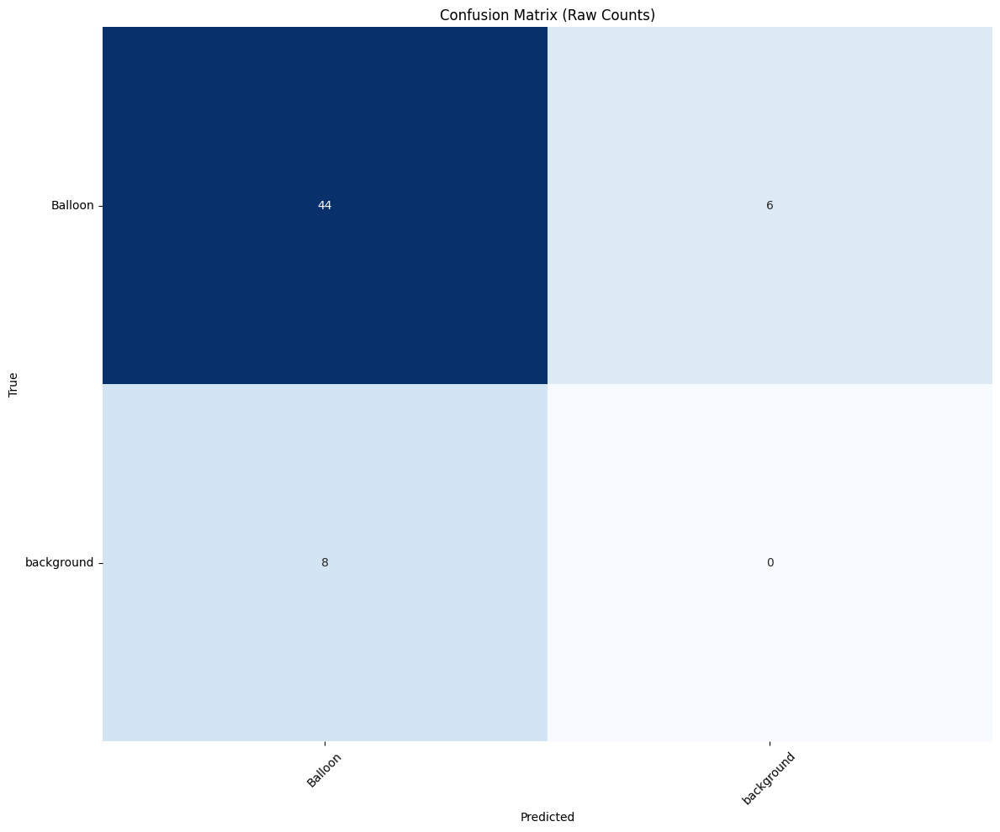

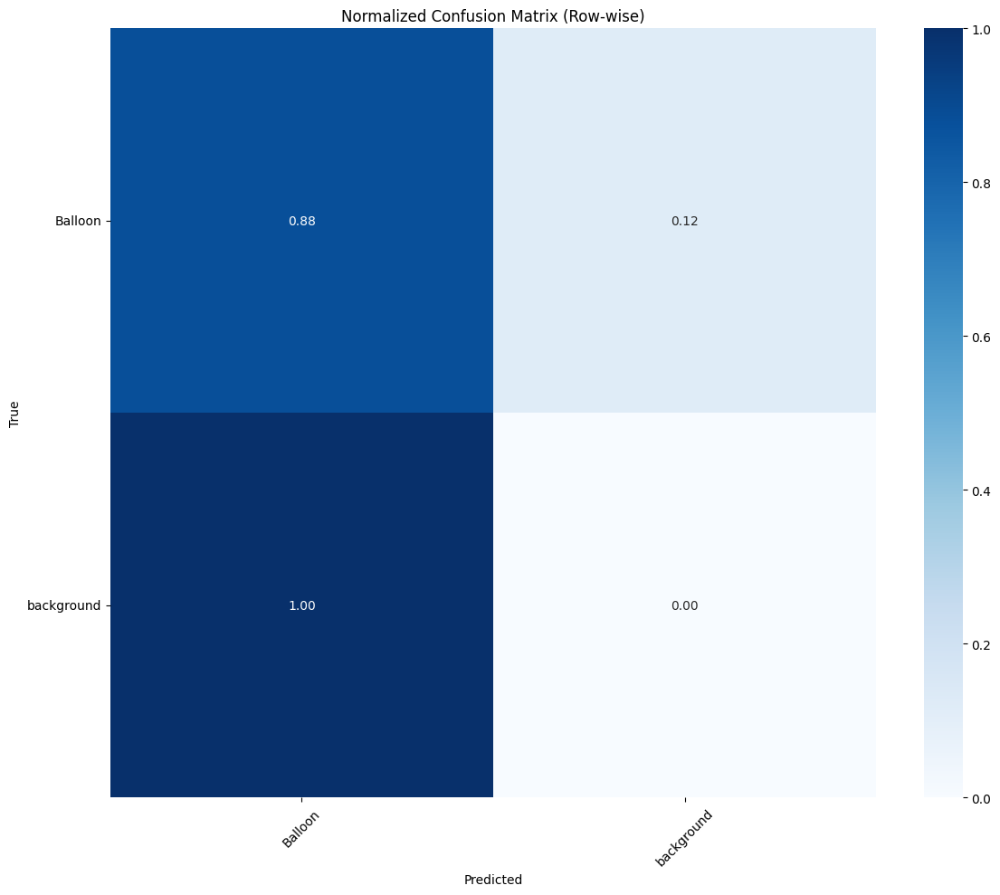

In [5]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from pycocotools import mask as maskUtils
import json
from pycocotools.coco import COCO
from pycocotools.cocoeval import COCOeval
from sklearn.metrics import confusion_matrix
from collections import defaultdict

# Load ground truth and predictions
truth_json = 'output/inference/balloon_val_coco_format.json'
pred_json = 'output/inference/coco_instances_results.json'

# Load COCO API for ground truth
coco_gt = COCO(truth_json)

# Load the original predictions
with open(pred_json) as f:
    pred_data = json.load(f)
    
# filter out low confidence
threshold = 0.7
filtered_data = [pred_data_t for pred_data_t in pred_data if pred_data_t['score']>=threshold]
coco_dt = coco_gt.loadRes(filtered_data)

class_names = [coco_gt.loadCats(ids)[0]['name'] for ids in coco_gt.getCatIds()]
num_classes = len(class_names)

def compute_mask_iou(rle1, rle2):
    """
    Compute IoU between two RLE masks using pycocotools.
    Args:
        rle1: RLE mask (dict with 'counts' and 'size')
        rle2: RLE mask (dict with 'counts' and 'size')
    Returns:
        iou (float): Intersection over Union
    """
    # Decode RLEs to binary masks
    mask1 = maskUtils.decode(rle1)
    mask2 = maskUtils.decode(rle2)
    
    # Intersection and Union
    intersection = np.logical_and(mask1, mask2)
    union = np.logical_or(mask1, mask2)
    
    iou = np.sum(intersection) / (np.sum(union) + 1e-6)  # Avoid division by zero
    return iou

def compute_confusion_matrix(coco_gt, coco_dt, iou_thresh=0.8):
    """
    Compute confusion matrix with IoU matching
    Returns: (raw_confusion_matrix, normalized_confusion_matrix)
    """
    num_classes = len(coco_gt.getCatIds())
    cm = np.zeros((num_classes+1, num_classes+1), dtype=int)  # +1 for background/FP
    
    for img_id in coco_gt.getImgIds():
        gt_anns = coco_gt.loadAnns(coco_gt.getAnnIds(imgIds=img_id))
        dt_anns = coco_dt.loadAnns(coco_dt.getAnnIds(imgIds=img_id))

        # Track which GT boxes have been matched
        matched_gt = [False] * len(gt_anns)
        
        # Process detections sorted by confidence (highest first)
        dt_anns = sorted(dt_anns, key=lambda x: -x['score'])
        
        for dt in dt_anns:
            pred_rle = {
                'size': dt['segmentation']['size'],
                'counts': dt['segmentation']['counts']
            }
            best_iou = iou_thresh
            best_idx = -1
            
            # Find best matching GT
            for i, gt in enumerate(gt_anns):
                if not matched_gt[i]:

                    # Polygon format (convert to RLE)
                    polygon = gt['segmentation']
                    
                    # Get image dimensions from COCO
                    img_info = coco_gt.loadImgs(gt['image_id'])[0]
                    height, width = img_info['height'], img_info['width']
                    
                    # Convert polygon to RLE
                    gt_rle = maskUtils.frPyObjects(polygon, height, width)
                    gt_rle = maskUtils.merge(gt_rle) #gt_rle[0]  # frPyObjects returns a list; take the first element
                    iou = compute_mask_iou(pred_rle, gt_rle)
                    if iou > best_iou:
                        best_iou = iou
                        best_idx = i
            
            if best_idx >= 0:  # True positive (of at least there is object, despite of classes)
                matched_gt[best_idx] = True
                gt_class = gt_anns[best_idx]['category_id']  
                dt_class = dt['category_id']   
                cm[gt_class, dt_class] += 1
            else:  # False positive
                dt_class = dt['category_id'] 
                cm[-1, dt_class] += 1  # Last row is for FP
        
        # Any unmatched GT are false negatives
        for i, matched in enumerate(matched_gt):
            if not matched:
                gt_class = gt_anns[i]['category_id'] 
                cm[gt_class, -1] += 1  # Last column is for FN
    
    # Normalized version (row-wise)
    cm_norm = cm.astype('float') / (cm.sum(axis=1)[:, np.newaxis] + 1e-6)
    
    return cm, cm_norm

# Compute matrices
cm_raw, cm_norm = compute_confusion_matrix(coco_gt, coco_dt)
class_names_with_bg = class_names + ['background']
# Plot raw confusion matrix
plt.figure(figsize=(12, 10))
sns.heatmap(cm_raw, annot=True, fmt='d', 
            xticklabels=class_names_with_bg, yticklabels=class_names_with_bg,
            cmap='Blues', cbar=False)
plt.title('Confusion Matrix (Raw Counts)')
plt.xlabel('Predicted')
plt.ylabel('True')
plt.xticks(rotation=45)
plt.yticks(rotation=0)
plt.tight_layout()
#plt.savefig('confusion_matrix_raw.png', dpi=300, bbox_inches='tight')
plt.show()

# Plot normalized confusion matrix
plt.figure(figsize=(12, 10))
sns.heatmap(cm_norm, annot=True, fmt='.2f', 
            xticklabels=class_names_with_bg, yticklabels=class_names_with_bg,
            cmap='Blues', vmin=0, vmax=1)
plt.title('Normalized Confusion Matrix (Row-wise)')
plt.xlabel('Predicted')
plt.ylabel('True')
plt.xticks(rotation=45)
plt.yticks(rotation=0)
plt.tight_layout()
#plt.savefig('confusion_matrix_normalized.png', dpi=300, bbox_inches='tight')
plt.show()

# The counts lie inside the top left to bottom right diagonal are the correct predictions
# The others are wrong predictions, where the x-axis is the predicted label and the y-axis is true label
# eg, the top right corner are the samples that are actually balloon but misclassified as background